In [613]:
import IPython.display as ipd
import librosa
import librosa.display
import matplotlib.pyplot as plt
import tensorflow 
from tensorflow import keras
import pandas as pd
import os
import numpy as np

In [614]:
file = r'C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original\classical\classical.00005.wav'

(array([-0.02459717, -0.04446411, -0.04428101, ..., -0.00109863,
        -0.00091553, -0.00152588], dtype=float32),
 22050)

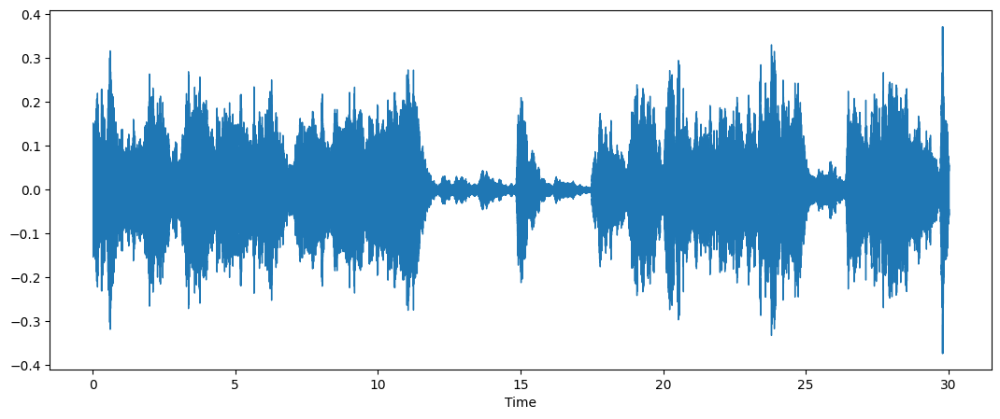

In [615]:
# eda
def load(file):
    plt.figure(figsize = (13 ,5))
    data , sample_rate = librosa.load(file)
    librosa.display.waveshow(data , sr = sample_rate)
    display(ipd.Audio(file))
    return data , sample_rate
load(file)

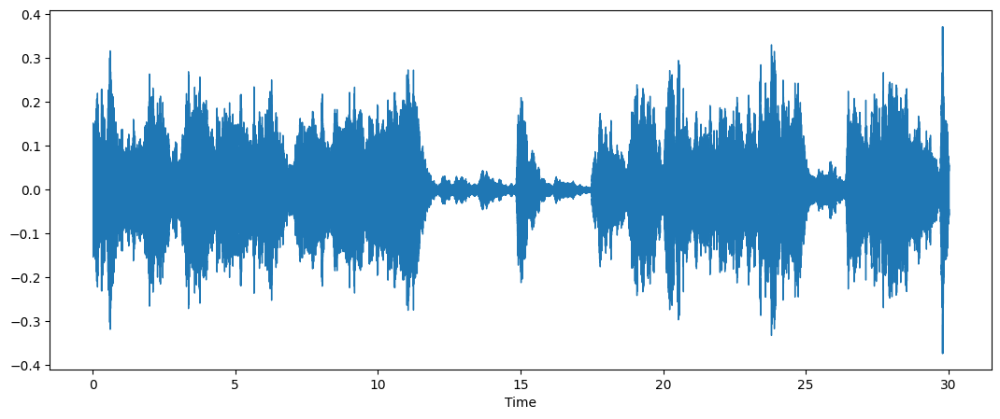

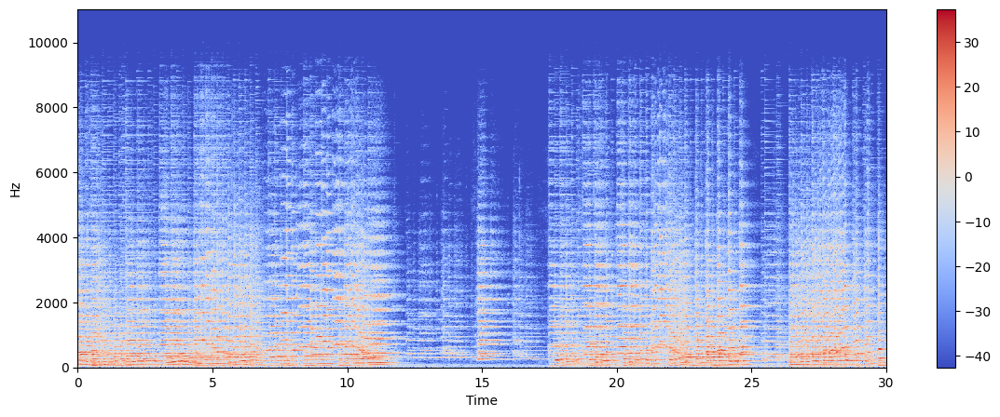

In [616]:
# checking the spectogram or voice map
data , sample_rate = load(file)
spec = librosa.stft(data)
spec_db = librosa.amplitude_to_db(abs(spec))
plt.figure(figsize = (14 ,5))
librosa.display.specshow(spec_db , sr = sample_rate , x_axis = 'time' , y_axis = 'hz')
plt.colorbar()                         

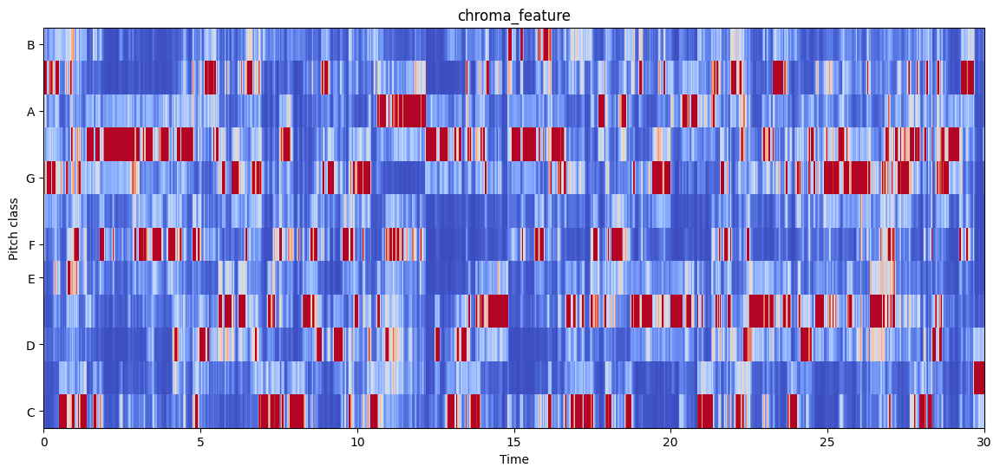

In [617]:
# chroma - It is a powerful tool for analyzing music features whose pitches can be meaningfully categorized and whose tuning approximates to the equal-tempered scale. One main property of chroma features is that they capture harmonic and melodic characteristics of music while being robust to changes in timbre and instrumentation. For more information visit
chroma = librosa.feature.chroma_stft(y = data , sr = sample_rate)
plt.figure(figsize = (14 ,6))
librosa.display.specshow( chroma , sr=sample_rate , x_axis= 'time' , y_axis = 'chroma' , cmap = 'coolwarm')
plt.title('chroma_feature')
plt.show()

In [641]:
# file exptractor 
db = pd.read_csv(r'C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\features_30_sec.csv')

In [642]:
db.head(10)

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,1.297741e+05,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,3.758501e+05,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,1.564676e+05,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,1.843559e+05,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,3.433999e+05,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues
5,blues.00005.wav,661794,0.302456,0.087532,0.103494,0.003981,1831.993940,1.030482e+06,1729.653287,201910.508633,...,72.549225,-1.838263,68.702026,-2.783800,42.447453,-3.047909,39.808784,-8.109991,46.311005,blues
6,blues.00006.wav,661794,0.291328,0.093981,0.141874,0.008803,1459.366472,4.378594e+05,1389.009131,185023.239545,...,83.248245,-10.913176,56.902153,-6.971336,38.231800,-3.436505,48.235741,-6.483466,70.170364,blues
7,blues.00007.wav,661794,0.307955,0.092903,0.131822,0.005531,1451.667066,4.495682e+05,1577.270941,168211.938804,...,70.438438,-10.568935,52.090893,-10.784515,60.461330,-4.690678,65.547516,-8.630722,56.401436,blues
8,blues.00008.wav,661794,0.408879,0.086512,0.142416,0.001507,1719.368948,1.632828e+05,2031.740381,105542.718193,...,50.563751,-7.041824,28.894934,2.695248,36.889568,3.412305,33.698597,-2.715692,36.418430,blues
9,blues.00009.wav,661794,0.273950,0.092316,0.081314,0.004347,1817.150863,2.982361e+05,1973.773306,114070.112591,...,59.314602,-1.916804,58.418438,-2.292661,83.205231,2.881967,77.082222,-4.235203,91.468811,blues


In [620]:
newdb = db.drop(db.columns[1:-1],axis= 1)

In [621]:
newdb.head(10)

,filename,label
0,blues.00000.wav,blues
1,blues.00001.wav,blues
2,blues.00002.wav,blues
3,blues.00003.wav,blues
4,blues.00004.wav,blues
5,blues.00005.wav,blues
6,blues.00006.wav,blues
7,blues.00007.wav,blues
8,blues.00008.wav,blues
9,blues.00009.wav,blues


In [622]:
db.count()

filename                   1000
length                     1000
chroma_stft_mean           1000
chroma_stft_var            1000
rms_mean                   1000
rms_var                    1000
spectral_centroid_mean     1000
spectral_centroid_var      1000
spectral_bandwidth_mean    1000
spectral_bandwidth_var     1000
rolloff_mean               1000
rolloff_var                1000
zero_crossing_rate_mean    1000
zero_crossing_rate_var     1000
harmony_mean               1000
harmony_var                1000
perceptr_mean              1000
perceptr_var               1000
tempo                      1000
mfcc1_mean                 1000
mfcc1_var                  1000
mfcc2_mean                 1000
mfcc2_var                  1000
mfcc3_mean                 1000
mfcc3_var                  1000
mfcc4_mean                 1000
mfcc4_var                  1000
mfcc5_mean                 1000
mfcc5_var                  1000
mfcc6_mean                 1000
mfcc6_var                  1000
mfcc7_me

In [623]:
newdb['path'] = newdb.apply(lambda row: os.path.join(r'C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original',
                                                     row.label , row.filename) , axis =1)

In [624]:
newdb

,filename,label,path
0,blues.00000.wav,blues,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
1,blues.00001.wav,blues,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
2,blues.00002.wav,blues,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
3,blues.00003.wav,blues,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
4,blues.00004.wav,blues,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
...,...,...,...
995,rock.00095.wav,rock,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
996,rock.00096.wav,rock,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
997,rock.00097.wav,rock,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
998,rock.00098.wav,rock,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...


In [625]:
newdb.path[566]


'C:\\Users\\Yash Verma\\OneDrive\\Desktop\\Machine Learning\\genre classifier\\Data\\genres_original\\jazz\\jazz.00066.wav'

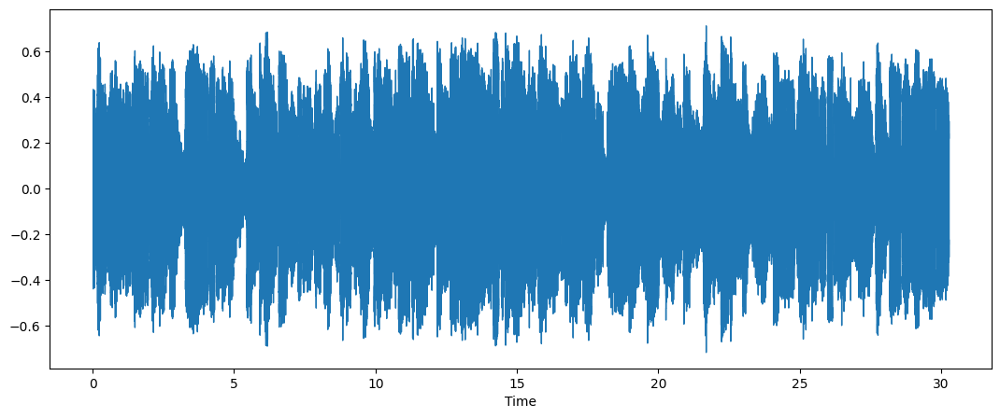

In [626]:
# eda
plt.figure(figsize = (13 ,5))
data , sample_rate = librosa.load(newdb.path[566])
librosa.display.waveshow(data , sr = sample_rate)
ipd.Audio(newdb.path[566])

array([[-3.0236255e+02, -2.7808160e+02, -2.5503671e+02, ...,
        -2.1767076e+02, -2.5044243e+02, -2.6937723e+02],
       [ 1.6040945e+02,  1.5824963e+02,  1.4818538e+02, ...,
         1.3858795e+02,  1.5161589e+02,  1.5785152e+02],
       [ 3.8300240e+01,  3.5927277e+01,  3.8421814e+01, ...,
        -1.4849854e-01,  1.1883404e+01,  2.3962339e+01],
       ...,
       [-6.8902397e+00, -8.6591682e+00, -4.5776854e+00, ...,
        -7.7348299e+00, -6.8578625e+00, -2.6062527e+00],
       [-1.1162350e+00, -3.7168272e+00, -2.7016029e+00, ...,
         3.1919036e+00, -3.0275397e+00, -6.4216727e-01],
       [ 1.5908270e+00,  3.4983230e+00, -1.8563104e-01, ...,
        -1.9360887e+00, -2.4280434e+00, -1.9805551e+00]], dtype=float32)

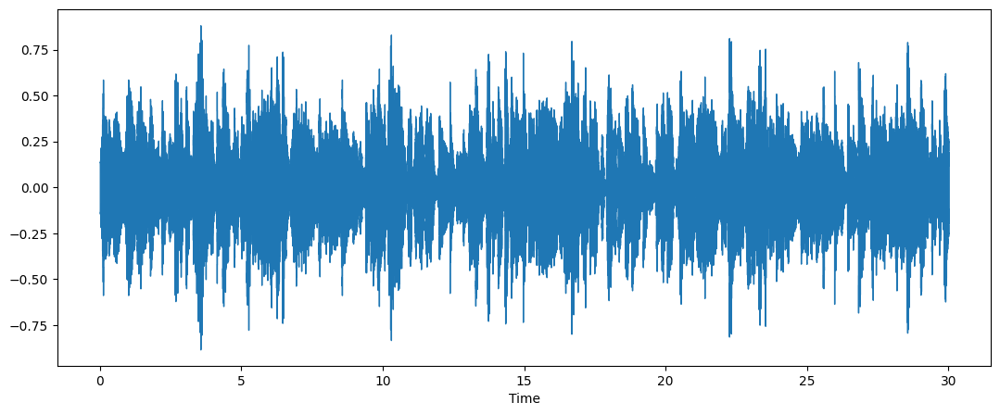

In [627]:

data , sr =load(newdb.path[90])
mfcc = librosa.feature.mfcc(y = data , sr = sample_rate , n_mfcc = 40)
mfcc



In [628]:
extracted_mfcc = []
extracted_chroma = []
def feature_extractor(files):
    a=0
    for i in files:
        try :
            print(f"iteration : {a}loading file :" , i)    
            ndata , nsr = librosa.load(i)
            mfcc = librosa.feature.mfcc(y= ndata , sr = nsr , n_mfcc = 70)
            mfcc_mean = np.mean(mfcc.T , axis =0)
            chroma = librosa.feature.chroma_stft(y = ndata , sr = nsr , n_chroma = 40)
            chroma_mean = np.mean(chroma.T , axis = 0)
            extracted_mfcc.append(mfcc_mean)
            extracted_chroma.append(chroma_mean)
            a+=1
          
        except Exception as e:
            print("failed to load: " ,i)
            newdb2=newdb.drop(index = a)
            a+=1
            continue
    return newdb2


newdb2 = feature_extractor(newdb.path)
print(extracted_chroma)
print(extracted_mfcc)
    

iteration : 0loading file : C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original\blues\blues.00000.wav
iteration : 1loading file : C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original\blues\blues.00001.wav
iteration : 2loading file : C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original\blues\blues.00002.wav
iteration : 3loading file : C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original\blues\blues.00003.wav
iteration : 4loading file : C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original\blues\blues.00004.wav
iteration : 5loading file : C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original\blues\blues.00005.wav
iteration : 6loading file : C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original\blues\blues.00006.wav
iterat

C:\Users\Yash Verma\AppData\Local\Temp\ipykernel_19816\2570504116.py:8: UserWarning: PySoundFile failed. Trying audioread instead.
  ndata , nsr = librosa.load(i)
C:\Anaconda\envs\baseML\Lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


iteration : 556loading file : C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original\jazz\jazz.00056.wav
iteration : 557loading file : C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original\jazz\jazz.00057.wav
iteration : 558loading file : C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original\jazz\jazz.00058.wav
iteration : 559loading file : C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original\jazz\jazz.00059.wav
iteration : 560loading file : C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original\jazz\jazz.00060.wav
iteration : 561loading file : C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original\jazz\jazz.00061.wav
iteration : 562loading file : C:\Users\Yash Verma\OneDrive\Desktop\Machine Learning\genre classifier\Data\genres_original\jazz\jazz.00062.wav
iterat

In [629]:
newdb2.iloc[553:557]


,filename,label,path
553,jazz.00053.wav,jazz,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
555,jazz.00055.wav,jazz,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
556,jazz.00056.wav,jazz,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
557,jazz.00057.wav,jazz,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...


In [643]:
newdb2.reset_index(drop =True , inplace = True)
newdb2.iloc[553:557]
newdb2['mfcc_mean'] = extracted_mfcc 
newdb2['chroma_mean'] = extracted_chroma
db=db.drop(index=554)
db

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,rock.00095.wav,661794,0.352063,0.080487,0.079486,0.000345,2008.149458,282174.689224,2106.541053,88609.749506,...,45.050526,-13.289984,41.754955,2.484145,36.778877,-6.713265,54.866825,-1.193787,49.950665,rock
996,rock.00096.wav,661794,0.398687,0.075086,0.076458,0.000588,2006.843354,182114.709510,2068.942009,82426.016726,...,33.851742,-10.848309,39.395096,1.881229,32.010040,-7.461491,39.196327,-2.795338,31.773624,rock
997,rock.00097.wav,661794,0.432142,0.075268,0.081651,0.000322,2077.526598,231657.968040,1927.293153,74717.124394,...,33.597008,-12.845291,36.367264,3.440978,36.001110,-12.588070,42.502201,-2.106337,29.865515,rock
998,rock.00098.wav,661794,0.362485,0.091506,0.083860,0.001211,1398.699344,240318.731073,1818.450280,109090.207161,...,46.324894,-4.416050,43.583942,1.556207,34.331261,-5.041897,47.227180,-3.590644,41.299088,rock


In [644]:
newdb2.head(10)
db.reset_index(drop = True , inplace = True)
db.iloc[553:555]

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
553,jazz.00053.wav,661794,0.311716,0.089816,0.130096,0.001595,1804.590753,297896.826331,1861.618734,38691.061629,...,86.707741,-0.019071,98.195518,-4.241150,80.778114,-4.228639,100.662315,-5.644222,133.644608,jazz
554,jazz.00055.wav,661794,0.264600,0.089981,0.091491,0.001231,871.435987,50272.399011,1204.835241,27182.687741,...,44.771915,-2.674797,36.528950,-4.601451,61.697742,-2.377337,44.470036,-3.115431,52.317623,jazz


In [645]:
len(extracted_mfcc)
len(extracted_chroma)
newdb2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   filename     999 non-null    object
 1   label        999 non-null    object
 2   path         999 non-null    object
 3   mfcc_mean    999 non-null    object
 4   chroma_mean  999 non-null    object
dtypes: object(5)
memory usage: 39.2+ KB


In [646]:
newdb2.label.value_counts()


label
blues        100
classical    100
country      100
disco        100
hiphop       100
metal        100
pop          100
reggae       100
rock         100
jazz          99
Name: count, dtype: int64

In [662]:
df= newdb2

In [663]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

In [664]:
y = encoder.fit_transform(df.label)

In [665]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3,

In [666]:
df


,filename,label,path,mfcc_mean,chroma_mean
0,blues.00000.wav,blues,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...,"[-113.59882, 121.57067, -19.162262, 42.363937,...","[0.27599525, 0.2837726, 0.25941744, 0.24770117..."
1,blues.00001.wav,blues,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...,"[-207.52383, 123.98514, 8.947019, 35.86715, 2....","[0.41000384, 0.37483197, 0.3242298, 0.2816486,..."
2,blues.00002.wav,blues,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...,"[-90.757164, 140.44087, -29.084547, 31.686691,...","[0.18061672, 0.15703757, 0.13443024, 0.1270310..."
3,blues.00003.wav,blues,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...,"[-199.57513, 150.0861, 5.663404, 26.855278, 1....","[0.29302788, 0.28502584, 0.28658202, 0.2992184..."
4,blues.00004.wav,blues,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...,"[-160.35417, 126.209496, -35.581394, 22.139256...","[0.13694885, 0.122248046, 0.12975481, 0.177823..."
...,...,...,...,...,...
994,rock.00095.wav,rock,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...,"[-153.63005, 109.904785, -23.091644, 59.014496...","[0.11085299, 0.12055341, 0.14386858, 0.2024904..."
995,rock.00096.wav,rock,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...,"[-142.41621, 116.20546, -32.160263, 49.111507,...","[0.17027628, 0.15533113, 0.15350452, 0.2131807..."
996,rock.00097.wav,rock,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...,"[-124.989655, 115.18234, -47.985886, 52.820343...","[0.29220784, 0.2737836, 0.25326687, 0.22144827..."
997,rock.00098.wav,rock,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...,"[-225.03333, 123.657265, -9.745125, 56.613846,...","[0.39257815, 0.4106527, 0.40167496, 0.344019, ..."


In [667]:
# new_df = pd.DataFrame(data_source, columns=column_names_list) 
# directly passing the arrays may not result the elements in the array being expanded to fit the columns created
mfcc_df = pd.DataFrame(df.mfcc_mean.tolist() , columns = [f'mfcc_mean{i}' for i in range(df.mfcc_mean[0].shape[0])]) 
chroma_df = pd.DataFrame(df.chroma_mean.tolist() , columns = [f'chroma_mean{i}' for i in range(df.chroma_mean[0].shape[0])])

In [668]:
mfcc_df
chroma_df


,chroma_mean0,chroma_mean1,chroma_mean2,chroma_mean3,chroma_mean4,chroma_mean5,chroma_mean6,chroma_mean7,chroma_mean8,chroma_mean9,...,chroma_mean30,chroma_mean31,chroma_mean32,chroma_mean33,chroma_mean34,chroma_mean35,chroma_mean36,chroma_mean37,chroma_mean38,chroma_mean39
0,0.275995,0.283773,0.259417,0.247701,0.248810,0.260747,0.314110,0.372765,0.278347,0.198700,...,0.228014,0.244855,0.217566,0.249073,0.295924,0.293983,0.273367,0.270417,0.242201,0.256040
1,0.410004,0.374832,0.324230,0.281649,0.245260,0.228627,0.232492,0.264987,0.240423,0.178711,...,0.202745,0.210320,0.198906,0.209703,0.240050,0.240926,0.232893,0.254791,0.290234,0.349792
2,0.180617,0.157038,0.134430,0.127031,0.129866,0.132657,0.165634,0.210805,0.228465,0.249533,...,0.295560,0.286909,0.253233,0.221847,0.221055,0.258095,0.361550,0.519870,0.452290,0.257680
3,0.293028,0.285026,0.286582,0.299218,0.320764,0.353813,0.393041,0.440454,0.464999,0.466957,...,0.196687,0.254974,0.275397,0.250813,0.233057,0.246246,0.259681,0.300331,0.347502,0.319712
4,0.136949,0.122248,0.129755,0.177823,0.226837,0.241415,0.264742,0.223372,0.163970,0.180956,...,0.188151,0.182666,0.285409,0.482424,0.408698,0.224143,0.145425,0.106677,0.086337,0.099901
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,0.110853,0.120553,0.143869,0.202490,0.301108,0.345409,0.429247,0.635790,0.709795,0.540338,...,0.327833,0.413589,0.325848,0.235055,0.169177,0.122059,0.116197,0.161563,0.149766,0.115379
995,0.170276,0.155331,0.153505,0.213181,0.395745,0.446507,0.280265,0.236808,0.222571,0.192000,...,0.515329,0.646103,0.575503,0.375965,0.289652,0.242384,0.225502,0.253995,0.302546,0.237437
996,0.292208,0.273784,0.253267,0.221448,0.237196,0.292206,0.240149,0.274420,0.439951,0.423984,...,0.292808,0.394028,0.447986,0.332196,0.254876,0.242617,0.228780,0.284149,0.406286,0.358281
997,0.392578,0.410653,0.401675,0.344019,0.298072,0.281417,0.261100,0.262182,0.262650,0.226457,...,0.278572,0.298323,0.297830,0.258354,0.218198,0.200075,0.205817,0.246107,0.319888,0.360042


In [669]:
df.reset_index(drop = True , inplace = True)


In [670]:
features_df = pd.concat([mfcc_df , chroma_df] , axis=1)
df = pd.concat([ features_df,df.drop(columns = ['mfcc_mean' , 'chroma_mean',])], axis=1)
df_old = df
df = df.drop(columns  = ['label'])
df

,mfcc_mean0,mfcc_mean1,mfcc_mean2,mfcc_mean3,mfcc_mean4,mfcc_mean5,mfcc_mean6,mfcc_mean7,mfcc_mean8,mfcc_mean9,...,chroma_mean32,chroma_mean33,chroma_mean34,chroma_mean35,chroma_mean36,chroma_mean37,chroma_mean38,chroma_mean39,filename,path
0,-113.598824,121.570671,-19.162262,42.363937,-6.362266,18.621933,-13.699734,15.339802,-12.274304,10.970945,...,0.217566,0.249073,0.295924,0.293983,0.273367,0.270417,0.242201,0.256040,blues.00000.wav,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
1,-207.523834,123.985138,8.947019,35.867149,2.909594,21.519472,-8.556513,23.370676,-10.103608,11.899242,...,0.198906,0.209703,0.240050,0.240926,0.232893,0.254791,0.290234,0.349792,blues.00001.wav,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
2,-90.757164,140.440872,-29.084547,31.686691,-13.976547,25.753752,-13.664991,11.634442,-11.778322,9.714756,...,0.253233,0.221847,0.221055,0.258095,0.361550,0.519870,0.452290,0.257680,blues.00002.wav,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
3,-199.575134,150.086105,5.663404,26.855278,1.770072,14.232647,-4.827846,9.286853,-0.756120,8.134434,...,0.275397,0.250813,0.233057,0.246246,0.259681,0.300331,0.347502,0.319712,blues.00003.wav,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
4,-160.354172,126.209496,-35.581394,22.139256,-32.473549,10.850701,-23.350071,0.493249,-11.796538,1.203519,...,0.285409,0.482424,0.408698,0.224143,0.145425,0.106677,0.086337,0.099901,blues.00004.wav,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,-153.630051,109.904785,-23.091644,59.014496,-7.520482,19.728552,-16.488035,18.078285,-22.212603,15.408715,...,0.325848,0.235055,0.169177,0.122059,0.116197,0.161563,0.149766,0.115379,rock.00095.wav,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
995,-142.416214,116.205460,-32.160263,49.111507,-8.389906,22.885155,-18.317211,20.110556,-22.102661,10.792425,...,0.575503,0.375965,0.289652,0.242384,0.225502,0.253995,0.302546,0.237437,rock.00096.wav,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
996,-124.989655,115.182343,-47.985886,52.820343,-13.493603,21.751259,-12.417660,20.127153,-18.373243,10.123631,...,0.447986,0.332196,0.254876,0.242617,0.228780,0.284149,0.406286,0.358281,rock.00097.wav,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...
997,-225.033325,123.657265,-9.745125,56.613846,10.421821,20.643209,-10.258778,15.571303,-8.240350,12.808757,...,0.297830,0.258354,0.218198,0.200075,0.205817,0.246107,0.319888,0.360042,rock.00098.wav,C:\Users\Yash Verma\OneDrive\Desktop\Machine L...


In [671]:
df = df.drop(columns = ['filename' , 'path'])


In [672]:
df['rms_mean'] = db['rms_mean']
df['tempo'] = db['tempo']
df['harmony_mean'] = db['harmony_mean']
df['rms_mean'] = db['rms_mean']
df = pd.concat([df , db.iloc[: , 6 : 13]], axis =1)
df

,mfcc_mean0,mfcc_mean1,mfcc_mean2,mfcc_mean3,mfcc_mean4,mfcc_mean5,mfcc_mean6,mfcc_mean7,mfcc_mean8,mfcc_mean9,...,rms_mean,tempo,harmony_mean,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean
0,-113.598824,121.570671,-19.162262,42.363937,-6.362266,18.621933,-13.699734,15.339802,-12.274304,10.970945,...,0.130228,123.046875,-4.529724e-05,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,0.083045
1,-207.523834,123.985138,8.947019,35.867149,2.909594,21.519472,-8.556513,23.370676,-10.103608,11.899242,...,0.095948,67.999589,1.395807e-04,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,0.056040
2,-90.757164,140.440872,-29.084547,31.686691,-13.976547,25.753752,-13.664991,11.634442,-11.778322,9.714756,...,0.175570,161.499023,2.105576e-06,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,0.076291
3,-199.575134,150.086105,5.663404,26.855278,1.770072,14.232647,-4.827846,9.286853,-0.756120,8.134434,...,0.141093,63.024009,4.583644e-07,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,0.033309
4,-160.354172,126.209496,-35.581394,22.139256,-32.473549,10.850701,-23.350071,0.493249,-11.796538,1.203519,...,0.091529,135.999178,-1.756129e-05,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,0.101461
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,-153.630051,109.904785,-23.091644,59.014496,-7.520482,19.728552,-16.488035,18.078285,-22.212603,15.408715,...,0.079486,103.359375,1.926835e-06,2008.149458,282174.689224,2106.541053,88609.749506,4253.557033,1.222421e+06,0.089227
995,-142.416214,116.205460,-32.160263,49.111507,-8.389906,22.885155,-18.317211,20.110556,-22.102661,10.792425,...,0.076458,117.453835,-1.406142e-06,2006.843354,182114.709510,2068.942009,82426.016726,4149.338328,1.046621e+06,0.097664
996,-124.989655,115.182343,-47.985886,52.820343,-13.493603,21.751259,-12.417660,20.127153,-18.373243,10.123631,...,0.081651,129.199219,-4.881450e-07,2077.526598,231657.968040,1927.293153,74717.124394,4031.405321,8.042154e+05,0.121823
997,-225.033325,123.657265,-9.745125,56.613846,10.421821,20.643209,-10.258778,15.571303,-8.240350,12.808757,...,0.083860,73.828125,7.986756e-07,1398.699344,240318.731073,1818.450280,109090.207161,3015.631004,1.332712e+06,0.048724


In [686]:


from sklearn.preprocessing import StandardScaler
scale = StandardScaler()
X = scale.fit_transform(df)

In [687]:
X.shape[1]

120

In [688]:
# entering the model selection part after preprocessing 
from sklearn.model_selection import train_test_split
X_train , X_test , Y_train , Y_test = train_test_split(X , y , test_size = 0.33)

In [689]:
len(X_train)

669

In [690]:
len(X_test)


330

In [691]:
import tensorflow as tf
print(tf.__version__)
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout,Activation,Flatten
from tensorflow.keras.optimizers import Adam
from sklearn import metrics

2.17.0


In [704]:
num_labels = db.label.nunique()

model=Sequential()
###first layer
model.add(Dense(200,input_shape=(X_train.shape[1],)))
model.add(Activation('relu'))
model.add(Dropout(0.6))
###second layer
model.add(Dense(150))
model.add(Activation('relu'))
model.add(Dropout(0.7))
###third layer
model.add(Dense(100))
model.add(Activation('relu'))
model.add(Dropout(0.6))

###final layer
model.add(Dense(10))
model.add(Activation('softmax'))

In [705]:
model.summary()

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_68 (Dense)                     │ (None, 200)                 │          24,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_68 (Activation)           │ (None, 200)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_51 (Dropout)                 │ (None, 200)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_69 (Dense)                     │ (None, 150)                 │          30,150 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_69 (Activation)           │ (None, 150)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_52 (Dropout)                 │ (None, 150)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_70 (Dense)                     │ (None, 100)                 │          15,100 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_70 (Activation)           │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_53 (Dropout)                 │ (None, 100)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_71 (Dense)                     │ (None, 10)                  │           1,010 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_71 (Activation)           │ (None, 10)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 70,460 (275.23 KB)

 Trainable params: 70,460 (275.23 KB)

 Non-trainable params: 0 (0.00 B)

In [706]:
model.compile(loss='sparse_categorical_crossentropy',metrics=['accuracy'],optimizer='adam')

In [707]:
## Trianing my model
from tensorflow.keras.callbacks import ModelCheckpoint
from datetime import datetime 

num_epochs = 300
num_batch_size = 32


start = datetime.now()

model.fit(X_train, Y_train, batch_size=num_batch_size, epochs=num_epochs, validation_data=(X_test, Y_test), verbose=1)


duration = datetime.now() - start
print("Training completed in time: ", duration)

Epoch 1/300
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.0887 - loss: 3.6637 - val_accuracy: 0.2455 - val_loss: 2.1745
Epoch 2/300
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1136 - loss: 2.9512 - val_accuracy: 0.3030 - val_loss: 2.1547
Epoch 3/300
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.1111 - loss: 2.7257 - val_accuracy: 0.3333 - val_loss: 2.1563
Epoch 4/300
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1440 - loss: 2.4905 - val_accuracy: 0.3303 - val_loss: 2.1477
Epoch 5/300
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1402 - loss: 2.3708 - val_accuracy: 0.3333 - val_loss: 2.1285
Epoch 6/300
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2128 - loss: 2.3236 - val_accuracy: 0.3818 - val_loss: 2.1095
Epoch 7/300
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1754 - loss: 2.2826 - val_accuracy: 0.3788 - val_loss: 2.0777
Epoch 8/300
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1827 - loss: 2.1933 - val_accuracy: 0.4000 - 

In [685]:
y

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3,

In [ ]:
extracted_mfcc =[]
extracted_chroma = []
newfile= pd.DataFrame(newdb.path[553:559])
newfile =  newfile.reset_index()
feature_extractor(newfile.path)
# newfile
dff_mfcc = pd.DataFrame(np.array(extracted_mfcc))
dff_chroma= pd.DataFrame(extracted_chroma)
final_df = pd.concat([dff_mfcc , dff_chroma] , axis=1)
final_df[130] = df.harmony_mean.iloc[553:558].values
final_df[131] = df.harmony_mean.iloc[553:558].values
final_df[132] = df.harmony_mean.iloc[553:558].values
nx = scale.fit_transform(final_df)
nx
predicted_label=model.predict(nx)
print(predicted_label)
predicted_label = np.argmax(predicted_label ,axis=1)
prediction_class = encoder.inverse_transform(predicted_label) 
prediction_class
